<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Base/AI_HW5_boosting_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашняя работа: прогнозирование заработной платы и кластеризация типов движений**

### **Постановка задачи:**

В этой работе две части:

*   В первой части вам предстоит построить алгоритм на основе бустинга для прогнозирования зарплаты
*   Во второй части вам предстоит кластеризовать типы движений по имеющимся данным с акселерометров и гироскопов

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Мягкий дедлайн: 16 февраля 23:59**

**Интересной вам работы!**


# **Часть 1. Прогнозирование заработной платы при помощи бустинга**

**Количество баллов:** 7

## **Постановка задачи:**

Данные выгружены и лежат в файле `ds_salary.csv`. Вам доступны описания признаков и значения целевой переменной.

**Ваша задача:** построение модели бустинга и оценка данной модели.

## **Описание даных**

- work_year: год, в который взяты данные;
- experience_level: уровень опыта, кодируемый как SE, MI EN или EX
- employment_type: тип занятости (FT, PT, CT, FL)
- job_title: название рабочей позиции в компании;
- salary: зарплата на позиции;
- salary_currency: валюта в которой начисляют зарплату;
- employee_residence: страна или регион проживания сотрудника
- remote_ratio: процент удаленки, предлагаемый в компании (0, 50, 100)
- company_location: местоположение компании
- company_size: размер компании, оцененный как S, M, L
- salary_in_usd: целевая переменная


Как всегда, загрузим набор данных.

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor
from sklearn.metrics import root_mean_squared_error as rmse, mean_absolute_percentage_error as mape
from sklearn.metrics import adjusted_rand_score as ami, adjusted_mutual_info_score as ari, v_measure_score as v_score
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from category_encoders import TargetEncoder
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from PIL import Image


import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

plt.style.use(['seaborn-v0_8-darkgrid'])
plt.rcParams['figure.figsize'] = (12, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'

%matplotlib inline
%config InlineBackend.figure_format="retina"

RANDOM_STATE = 42

In [2]:
df = pd.read_csv("https://github.com/hse-ds/iad-intro-ds/raw/refs/heads/master/2023/homeworks/hw-08-boosting/ds_salaries.csv")

## **Задание 1 (0.3 балла)**

Вам даны описания переменных. Проверьте, что категориальные признаки, категории которых перечислены, не имеют ошибочных значений. Для этого:

- Напишите цикл, пробегающий по выбранным признакам и оценивающий, что в них нет лишних значений;

In [3]:
df.head(5)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M


In [ ]:
# Допустимые значения для каждого категориального признака:
allowed_categories = {
    'experience_level': {'SE', 'MI', 'EN', 'EX'},
    'employment_type': {'FT', 'PT', 'CT', 'FL'},
    'remote_ratio': {0, 50, 100},
    'company_size': {'S', 'M', 'L'}
}

# Цикл для проверки значений
for feature, allowed in allowed_categories.items():
    unique_values = set(df[feature].unique())
    # Находим значения, которые не входят в список допустимых
    extra_values = unique_values - allowed
    if extra_values:
        print(f"В признаке {feature} обнаружены недопустимые значения: {extra_values}")
    else:
        print(f"С признаком {feature} всё в порядке")

С признаком experience_level всё в порядке
С признаком employment_type всё в порядке
С признаком remote_ratio всё в порядке
С признаком company_size всё в порядке


`С категориальными признаками, которые можем проверить через цикл, всё в порядке`

## **Задание 2 (0.3 балла)**

Проведите базовые шаги оценки качества данных.
- Есть есть проблемы, устраните их;
- Если нет проблем, кратко опишите это.

In [5]:
# Пропуски
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           3755 non-null   int64 
 1   experience_level    3755 non-null   object
 2   employment_type     3755 non-null   object
 3   job_title           3755 non-null   object
 4   salary              3755 non-null   int64 
 5   salary_currency     3755 non-null   object
 6   salary_in_usd       3755 non-null   int64 
 7   employee_residence  3755 non-null   object
 8   remote_ratio        3755 non-null   int64 
 9   company_location    3755 non-null   object
 10  company_size        3755 non-null   object
dtypes: int64(4), object(7)
memory usage: 322.8+ KB


`Пропусков нет`

In [6]:
# Дубликаты
print(df.duplicated().sum())
df = df.drop_duplicates()

1171


`Примерно треть данных были дублями, удалили их`

## **Задание 3 (0.3 балла)**

Вернитесь к описанию признаков.
- Проверьте, все ли признаки соответствуют постановке задачи? Если есть лишние признаки, удалите их и обоснуйте удаление, если нет, сделайте вывод о релевантности (достаточно в одну-две строки)
- Зафиксируйте, в каких признаках много категорий.

In [7]:
df.describe(include='all')

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
count,2584.000000,2584,2584,2584,2.584000e+03,2584,2584.000000,2584,2584.000000,2584,2584
unique,NaN,4,4,93,NaN,20,NaN,78,NaN,72,3
top,NaN,SE,FT,Data Engineer,NaN,USD,NaN,US,NaN,US,M
freq,NaN,1554,2547,598,NaN,2107,NaN,1893,NaN,1929,2028
mean,2022.301084,NaN,NaN,NaN,2.103653e+05,NaN,133409.280186,NaN,50.483746,NaN,NaN
std,0.749179,NaN,NaN,NaN,8.080375e+05,NaN,67136.837329,NaN,48.163707,NaN,NaN
min,2020.000000,NaN,NaN,NaN,6.000000e+03,NaN,5132.000000,NaN,0.000000,NaN,NaN
25%,2022.000000,NaN,NaN,NaN,9.000000e+04,NaN,84975.000000,NaN,0.000000,NaN,NaN
50%,2022.000000,NaN,NaN,NaN,1.346300e+05,NaN,130000.000000,NaN,50.000000,NaN,NaN
75%,2023.000000,NaN,NaN,NaN,1.825625e+05,NaN,175000.000000,NaN,100.000000,NaN,NaN


In [8]:
df = df.drop(columns=['salary', 'salary_currency'])

**Ваши выводы здесь**
* Нашим таргетом является `salary_in_usd`, соответственно будет логичным удалить столбцы `salary` и `salary_currency` (чтобы избежать дублирования таргета)
* Категориальные столбцы `job_title`, `employee_residence` и `company_location` содержат большое количество уникальных значений (93, 78 и 72 соответственно), в следующих заданиях будем кодировать их разными методами

## **Задание 4 (0.2 балла)**

Разделите выборку на train, test (80%, 20%).

In [ ]:
# Разделение выборки
X = df.drop(columns=['salary_in_usd']).copy()
y = df['salary_in_usd']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## **Задание 5 (0.3 балла)**

Будем проверять два сценария. Первый — построение модели только на непрерывных признаках, а второй — построение с категориальными. В этом задании подготовьте всё, чтобы проверить валидность обоих сценариев. А именно:

- Выделите данные для тренировки и теста для непрерывных признаков
- Выделите данные для тренировки и теста для непрерывных + категориальных признаков, пока ничего не кодируйте.

In [ ]:
# Столбцы с категориальными и непрерывными признаками
cat_cols = X.select_dtypes(include='object').columns
num_cols = X.select_dtypes(include=int).columns

# Только непрерывные признаки, непрерывные+категориальные разделили в прошлом пункте
X_train_num = X_train[num_cols]
X_test_num = X_test[num_cols]

## **Задание 6 (0.2 балла)**

- Обучите модель линейной регресии на числовых признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [11]:
# Обучаем линрег
lr = LinearRegression()
lr.fit(X_train_num, y_train)
y_pred_lr = lr.predict(X_test_num)

In [12]:
# Метрики
print(round(rmse(y_test, y_pred_lr), 2))
print(round(mape(y_test, y_pred_lr), 2))

64000.53
0.83


In [13]:
y_test.describe()

count       517.000000
mean     132765.431335
std       66200.821478
min        5409.000000
25%       80000.000000
50%      130000.000000
75%      180000.000000
max      430967.000000
Name: salary_in_usd, dtype: float64

`Выводы`
* Среднее значение нашего таргета - 132765, при этом наш RMSE равен 64000, то есть предикт в среднем отклоняется на 48% от среднего значения таргета, линрег делает предсказания с довольной ошибкой
* MAPE со значением 0.83 говорит о том, что средняя ошибка линрега составляет 83% от истинного значения, что также говорит об очень неточном предсказании модели

## **Задание 8 (0.2 балла)**

- Обучите модель бустинга (любую из трех библиотек catboost, xgboost, lightgbm) с гиперпараметрами по умолчанию на непрерывных признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [14]:
# Обучаем lightgbm
lgbm = LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
lgbm.fit(X_train_num, y_train)
y_pred_lgbm = lgbm.predict(X_test_num)

In [15]:
# Метрики
print(round(rmse(y_test, y_pred_lgbm), 2))
print(round(mape(y_test, y_pred_lgbm), 2))

62311.98
0.77


`Выводы`
* RMSE для бустинга уменьшился по сравнению с линрегом - 62311, предикт в среднем отклоняется на 47% от среднего значения таргета
* MAPE для бустинга стал тоже лучше - 0.77, средняя ошибка составляет 77% от истинного значения, что опять же говорит об очень неточном предсказании модели

## **Задание 9 (0.8 балла)**

Теперь подключим категориальные признаки. Но попробуем разные стратегии предобработки.

**1:**
- Предобработайте категориальные признаки при помощи OHE
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**2:**
- Предобработайте категориальные признаки при помощи LabelEncoding
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**3:**
- Предобработайте категориальные признаки при помощи MeanTargetEnc
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

Сделайте выводы по построениям 1-3. Выберите лучшую модель и дальше поработайте с ней.

In [16]:
# Функция для расчёта метрик линрега и бустинга
def model_metrics(X_tr, X_te, y_tr, y_te):
    # Линрег
    lr = LinearRegression()
    lr.fit(X_tr, y_tr)
    y_pred_lr = lr.predict(X_te)

    rmse_lr = round(rmse(y_te, y_pred_lr), 0)
    mape_lr = round(mape(y_te, y_pred_lr), 3)

    # lightgbm
    lgbm = LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1)
    lgbm.fit(X_tr, y_tr)
    y_pred_lgbm = lgbm.predict(X_te)

    rmse_lgbm = round(rmse(y_te, y_pred_lgbm), 0)
    mape_lgbm = round(mape(y_te, y_pred_lgbm), 3)

    return(rmse_lr, mape_lr, rmse_lgbm, mape_lgbm, y_pred_lr, y_pred_lgbm)

In [17]:
# OHE
ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore', drop='first')
X_train_ohe = ohe.fit_transform(X_train[cat_cols])
X_test_ohe = ohe.transform(X_test[cat_cols])

# Расчёт метрик
rmse_lr_ohe, mape_lr_ohe, rmse_lgbm_ohe, mape_lgbm_ohe, y_pred_lr_ohe, y_pred_lgbm_ohe = (
    model_metrics(X_train_ohe, X_test_ohe, y_train, y_test))

In [18]:
X_train_ohe

array([[0., 0., 1., ..., 1., 1., 0.],
       [0., 1., 0., ..., 1., 1., 0.],
       [0., 0., 1., ..., 1., 1., 0.],
       ...,
       [0., 1., 0., ..., 0., 1., 0.],
       [0., 0., 1., ..., 1., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [19]:
# LabelEncoding
X_train_le = X_train.copy()
X_test_le = X_test.copy()

# Сохраняем маппинг для каждого столбца
mappings = {}

for col in cat_cols:
    le = LabelEncoder()
    X_train_le[col] = le.fit_transform(X_train[col])

    # маппинг: категория -> числовое значение
    mappings[col] = {category: idx for idx, category in enumerate(le.classes_)}

    X_test_le[col] = X_test[col].apply(lambda x: mappings[col].get(x, -1)) 

# Расчёт метрик
rmse_lr_le, mape_lr_le, rmse_lgbm_le, mape_lgbm_le, y_pred_lr_le, y_pred_lgbm_le = (
    model_metrics(X_train_le, X_test_le, y_train, y_test))

In [20]:
X_train_le.head(2)

,work_year,experience_level,employment_type,job_title,employee_residence,remote_ratio,company_location,company_size
25,2023,3,2,18,72,0,68,1
2647,2022,2,2,36,72,0,68,1


In [21]:
# TargetEncoding
te = TargetEncoder(cols=cat_cols)
X_train_te = te.fit_transform(X_train, y_train)
X_test_te = te.transform(X_test)

# Получаем метрики
rmse_lr_te, mape_lr_te, rmse_lgbm_te, mape_lgbm_te, y_pred_lr_te, y_pred_lgbm_te = (
    model_metrics(X_train_te, X_test_te, y_train, y_test))

In [22]:
X_train_te.head(2)

,work_year,experience_level,employment_type,job_title,employee_residence,remote_ratio,company_location,company_size
25,2023,153928.101613,134345.933399,140386.960403,154936.143621,0,153709.300722,141193.997523
2647,2022,102470.895522,134345.933399,124467.935135,154936.143621,0,153709.300722,141193.997523


In [23]:
# Метрик для разных видов кодировок
print('OHE')
print(f"""RMSE LinReg: {rmse_lr_ohe},\nMAPE LinReg: {mape_lr_ohe},
RMSE LGBM: {rmse_lgbm_ohe},\nMAPE LGBM: {mape_lgbm_ohe}\n""")

print('LabelEncoding')
print(f"""RMSE LinReg: {rmse_lr_le},\nMAPE LinReg: {mape_lr_le},
RMSE LGBM: {rmse_lgbm_le},\nMAPE LGBM: {mape_lgbm_le}\n""")

print('TargetEncoding')
print(f"""RMSE LinReg: {rmse_lr_te},\nMAPE LinReg: {mape_lr_te},
RMSE LGBM: {rmse_lgbm_te},\nMAPE LGBM: {mape_lgbm_te}""")

OHE
RMSE LinReg: 53544.0,
MAPE LinReg: 0.461,
RMSE LGBM: 53111.0,
MAPE LGBM: 0.45

LabelEncoding
RMSE LinReg: 55932.0,
MAPE LinReg: 0.572,
RMSE LGBM: 53073.0,
MAPE LGBM: 0.495

TargetEncoding
RMSE LinReg: 52529.0,
MAPE LinReg: 0.468,
RMSE LGBM: 52099.0,
MAPE LGBM: 0.456


**Выводы**

`Линейная регрессия`
* TargetEncoding (MeanTargetEncoding) показывает наименьший RMSE (52 529), при этом значение MAPE (0.468) почти сопоставимо с OHE (0.461)
* One-Hot Encoding показывает чуть лучшее значение MAPE (0.461), но при этом RMSE немного выше (53 544)
* LabelEncoding даёт наихудшие показатели: самый высокий RMSE (55 932) и MAPE (0.572)

`LGBM`
* TargetEncoding также показывает наилучший RMSE (52 099) по сравнению с OHE (53 111) и LabelEncoding (53 073).
* One-Hot Encoding показывает наименьший MAPE (0.45), но разница с TargetEncoding (0.456) незначительна
* LabelEncoding также уступает по MAPE (0.495)

`Итого`
* Для обоих моделей TargetEncoding является лучшим методом кодировки, если смотреть по RMSE. Если смотреть по MAPE, то One-Hot Encoding оказывается незначительно лучше. Для следующего пункта возьмём за основу линейную регрессию + TargetEncoding

## **Задание 10 (0.5 балла)**

Покажите, где ошибается ваша модель. Выведите топ 20 примеров с наибольшей ошибкой. Проанализируйте их. Какие выводы можно сделать? Что стоит изменить в данных чтобы улучшить качество модели?

In [24]:
# Рассмотрим ошибки лучшей из моделей - линрег + TargetEncoding
# Соединим X и y, посмотрим топ 20 примеров с наибольшей ошибкой
errors = round(np.abs(y_test-y_pred_lr_te), 0)
results = pd.DataFrame({'real': y_test, 'predicted': np.round(y_pred_lr_te, 0), 'error': errors}).join(X_test)
results.sort_values(by='error', ascending=False).head(20)

,real,predicted,error,work_year,experience_level,employment_type,job_title,employee_residence,remote_ratio,company_location,company_size
2011,430967,39869.0,391098.0,2022,MI,FT,Data Analyst,GB,0,GB,M
1288,385000,134854.0,250146.0,2023,SE,FT,Data Analyst,US,0,US,M
3155,200000,24310.0,175690.0,2022,MI,FT,AI Scientist,IN,100,US,L
2406,315000,162676.0,152324.0,2022,SE,FT,Data Engineer,US,100,US,M
1247,253750,108499.0,145251.0,2023,SE,FT,Research Scientist,ES,0,ES,M
3545,250000,113522.0,136478.0,2020,EN,FT,Machine Learning Engineer,US,50,US,L
1695,72000,198653.0,126653.0,2023,SE,FT,Applied Scientist,US,0,US,L
1847,260000,137702.0,122298.0,2022,MI,FT,Data Engineer,US,0,US,M
1647,291500,171261.0,120239.0,2023,SE,FT,Data Engineer,US,0,US,M
801,250000,130196.0,119804.0,2023,SE,FT,Data Analyst,US,100,US,M


`Выводы`
* Почти для всех примеров характерна значительная недооценка/переоценка зарплаты (>100к)
* Практически все примеры относятся к full-time должностям сферы данных (Data Analyst, Data Engineer и т.д.), возможно модель хуже справляется с предсказанием зарплаты для конкретных должностей
* Большинство наблюдений связаны с рынком US (employee_residence и company_location), хотя встречаются и другие страны (но в значительно меньшем количестве)
* Очень большие ошибки для некоторых примеров могут говорить о наличии выбросов или необычных комбинаций признаков, с чем возможно придётся дополнительно поработать

`Возможные пути для улучшения качества модели`
* Базовая проверка на наличие выбросов, удаление неккоректных значений
* Стандартизация данных
* Преобразование таргета (например логарифмирование)
* Создание новых признаков (этим займёмся далее)

## **Задание 11 (0.5 балла)**

Придумайте признаки для улучшения качества модели на основе предыдущего пункта. Как вам кажется какими признаками можно улучшить качество модели? Реализуйте признаки и проверьте улучшилось ли качество модели.

**Примечание:**
Полный балл за задание ставится даже при отсутствии улучшения качества модели, важно попробовать проверить свои гипотезы и сделать выводы.

In [ ]:
X_train_fe = X_train.copy()
X_test_fe = X_test.copy()

for x in [X_train_fe, X_test_fe]:
    # Закодируем уровень опыта, где 1 - начинающий спец, 4 - эксперт
    x['experience_level'] = x['experience_level'].map({'EN':1, 'MI':2, 'SE':3, 'EX':4})

    # Размер компании закодируем аналогично
    x['company_size'] = x['company_size'].map({'S':1, 'M':2, 'L':3})

    # Так как FT - наиболее частая категория, закодируем его 1, PT - как неполный рабочий день кодируем 0.5
    # Остальные категории (которых пренебрежительно мало) закодируем -1
    x['employment_type'] = x['employment_type'].map({'FT':1, 'PT':0.5, 'FL':-1, 'CT':-1})

    # Выделим краткое название должности в отдельные столбцев (Analyst, Engineer и т.д.)
    x["job_title_short"] = x["job_title"].str.split().str[-1]

    # Подсчет количества вхождений каждой страны
    # Заменяем страны с количеством < 3 на Other
    country_counts = x["company_location"].value_counts()
    x["company_location"] = x["company_location"].mask(x["company_location"].map(country_counts) < 3, "Other")

    # Аналогично для местоположения сотрудников
    country_counts_empl = x["employee_residence"].value_counts()
    x["employee_residence"] = x["employee_residence"].mask(x["employee_residence"].map(country_counts_empl) < 3, "Other")


In [27]:
X_train_fe.head(2)

,work_year,experience_level,employment_type,job_title,employee_residence,remote_ratio,company_location,company_size,job_title_short
25,2023,3,1.0,Business Intelligence Engineer,US,0,US,2,Engineer
2647,2022,2,1.0,Data Manager,US,0,US,2,Manager


In [28]:
# OHE
ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore', drop='first')
cat_cols_fe = X_train_fe.select_dtypes(include='object').columns
X_train_ohe_fe = ohe.fit_transform(X_train_fe[cat_cols_fe])
X_test_ohe_fe = ohe.transform(X_test_fe[cat_cols_fe])

# Расчёт метрик
rmse_lr_ohe, mape_lr_ohe, rmse_lgbm_ohe, mape_lgbm_ohe, y_pred_lr_ohe, y_pred_lgbm_ohe = (
    model_metrics(X_train_ohe_fe, X_test_ohe_fe, y_train, y_test))

# TargetEncoding
te = TargetEncoder(cols=cat_cols_fe)
X_train_te_fe = te.fit_transform(X_train_fe, y_train)
X_test_te__fe = te.transform(X_test_fe)

# Получаем метрики
rmse_lr_te, mape_lr_te, rmse_lgbm_te, mape_lgbm_te, y_pred_lr_te, y_pred_lgbm_te = (
    model_metrics(X_train_te_fe, X_test_te__fe, y_train, y_test))

In [ ]:
# Метрики для разных видов кодировок (Label Encoding не рассматриваем, тк он показал себя хуже всех методов в прошлых пунктах)
print('OHE')
print(f"""RMSE LinReg: {rmse_lr_ohe},\nMAPE LinReg: {mape_lr_ohe},
RMSE LGBM: {rmse_lgbm_ohe},\nMAPE LGBM: {mape_lgbm_ohe}\n""")

print('TargetEncoding')
print(f"""RMSE LinReg: {rmse_lr_te},\nMAPE LinReg: {mape_lr_te},
RMSE LGBM: {rmse_lgbm_te},\nMAPE LGBM: {mape_lgbm_te}""")

OHE
RMSE LinReg: 54991.0,
MAPE LinReg: 0.49,
RMSE LGBM: 56302.0,
MAPE LGBM: 0.526

TargetEncoding
RMSE LinReg: 51956.0,
MAPE LinReg: 0.435,
RMSE LGBM: 52762.0,
MAPE LGBM: 0.481


`Выводы после применения Feature Engineering`
* Результаты моделей с кодировкой OHE ухудшились (линейная регрессия: RMSE вырос с 53 544 до 54 991, MAPE с 0.461 до 0.49. Для LGBM выводы такие: RMSE увеличился с 53 111 до 56 302, MAPE с 0.45 до 0.526). Возможно новые признаки добавили дополнительный шум, поэтому качество уменьшилось
* С применением метода TargetEncoding для линейной регрессии RMSE снизился с 52 529 до 51 956, MAPE с 0.468 до 0.435, при этом для LGBM метрики ухудшились (RMSE с 52 099 до 52 762, MAPE с 0.456 до 0.481)
* Линейная регрессия оказывается более чувствительной к выбору метода кодирования и Feature Engineering, при это метрики улучшаются при использовании Target Encoding более значимо для данной модели, тогда как для LGBM Feature Engineering не дал улучшения качества

## **Задание 12 (1 балл)**

Поупражняемся с разными бустингами!

- Используйте catboost.
- Обучите модель — на полном наборе данных с категориальными признаками.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


**Примечание:**
Замерять скорость = смотреть, как долго исполняется код.

In [ ]:
# Для всех бустингов будем использовать OHE кодировка
# Catboost
cat = CatBoostRegressor(thread_count=-1, silent=True)
cat.fit(X_train_ohe, y_train)
y_pred_cat = cat.predict(X_test_ohe)

# Метрики
print("RMSE", round(rmse(y_test, y_pred_cat), 0))
print("MAPE", round(mape(y_test, y_pred_cat), 3))

RMSE 51558.0
MAPE 0.411


In [ ]:
%%time
# Optuna для поиска оптимальных гиперпараметров
def objective_cat(trial):    
    depth = trial.suggest_int("depth", 3, 12)
    learning_rate = trial.suggest_float('learning_rate', 1e-3, 1e-1)
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)

    # Задаём модель
    model = CatBoostRegressor(
        depth = depth,
        learning_rate = learning_rate,
        n_estimators = n_estimators,
        silent = True,
        random_state = 42)

    score = cross_val_score(model, X_train_ohe, y_train, cv=3, scoring="neg_root_mean_squared_error",  n_jobs=-1).mean()
    return score


study = optuna.create_study(direction="maximize")
study.optimize(objective_cat, n_trials=50)

CPU times: total: 859 ms
Wall time: 5min 41s


In [ ]:
# Результаты
print("Лучшие параметры:", study.best_params)

# Обучение модели с лучшими параметрами
best_params = study.best_params
best_model = CatBoostRegressor(**best_params, thread_count=-1, silent=True, random_state=42)
best_model.fit(X_train_ohe, y_train)
y_pred_best_cat = best_model.predict(X_test_ohe)

# Метрики
print("RMSE", round(rmse(y_test, y_pred_best_cat), 0))
print("MAPE", round(mape(y_test, y_pred_best_cat), 3))

Лучшие параметры: {'depth': 12, 'learning_rate': 0.0304673942700974, 'n_estimators': 422}
RMSE 51163.0
MAPE 0.432


`Выводы`
* Catboost (с базовыми параметрами) даёт хорошие значения метрик RMSE (51 558) и MAPE (0.41)
* После подбора гиперпараметров через Optuna получилось незначительно снизить RMSE (51 163), но при этом вырос MAPE (0.43)
* Время для подбора гиперпараметров - около 6 минут, обучение итоговой модели - 40 секунд

## **Задание 13 (1 балл)**

- Используйте xgboost.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.



In [ ]:
# XGB и OHE кодировка
xgb = XGBRegressor(n_jobs=-1, random_state=42)
xgb.fit(X_train_ohe, y_train)
y_pred_xgb = xgb.predict(X_test_ohe)

# Метрики
print("RMSE", round(rmse(y_test, y_pred_xgb), 0))
print("MAPE", round(mape(y_test, y_pred_xgb), 3))

RMSE 52313.0
MAPE 0.419


In [ ]:
%%time
# Optuna для поиска оптимальных гиперпараметров
def objective_xgb(trial):    
    max_depth  = trial.suggest_int("max_depth", 3, 12)
    learning_rate = trial.suggest_float('learning_rate', 1e-3, 1e-1)
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)

    # Задаём модель
    model = XGBRegressor(
        max_depth = max_depth ,
        learning_rate = learning_rate,
        n_estimators = n_estimators,
        verbosity = 0,
        random_state = 42)

    score = cross_val_score(model, X_train_ohe, y_train, cv=3, scoring="neg_root_mean_squared_error",  n_jobs=-1).mean()
    return score


study = optuna.create_study(direction="maximize")
study.optimize(objective_xgb, n_trials=50)

CPU times: total: 1.88 s
Wall time: 19.6 s


In [ ]:
# Результаты
print("Лучшие параметры:", study.best_params)

# Обучение модели с лучшими параметрами
best_params = study.best_params
best_model = XGBRegressor(**best_params, n_jobs=-1, verbosity=0, random_state=42)
best_model.fit(X_train_ohe, y_train)
y_pred_best_xgb = best_model.predict(X_test_ohe)

# Метрики
print("RMSE", round(rmse(y_test, y_pred_best_xgb), 0))
print("MAPE", round(mape(y_test, y_pred_best_xgb), 3))

Лучшие параметры: {'max_depth': 3, 'learning_rate': 0.04323439422732278, 'n_estimators': 364}
RMSE 51056.0
MAPE 0.438


`Выводы`
* XGBoost (с базовыми параметрами) также даёт неплохие значения метрик RMSE (52 313) и MAPE (0.42)
* После подбора гиперпараметров через Optuna получилось снизить RMSE (51 056), при этом также вырос MAPE (0.44)
* Время для подбора гиперпараметров - около 20 секунд, обучение итоговой модели - менее 1 секунды

## **Задание 14 (1 балл)**

- Используйте lgbm.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


In [ ]:
# LGBM и OHE кодировка
lgbm = LGBMRegressor(random_state=42, n_jobs=-1, verbose=0)
lgbm.fit(X_train_ohe, y_train)
y_pred_lgbm = lgbm.predict(X_test_ohe)

# Метрики
print("RMSE", round(rmse(y_test, y_pred_lgbm), 0))
print("MAPE", round(mape(y_test, y_pred_lgbm), 3))

RMSE 53111.0
MAPE 0.45


In [ ]:
%%time
# Optuna для поиска оптимальных гиперпараметров
def objective_lgbm(trial):    
    max_depth  = trial.suggest_int("max_depth", 3, 12)
    learning_rate = trial.suggest_float('learning_rate', 1e-3, 1e-1)
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)

    # Задаём модель
    model = LGBMRegressor(
        max_depth = max_depth,
        learning_rate = learning_rate,
        n_estimators = n_estimators,
        verbose = 0,
        random_state = 42)

    score = cross_val_score(model, X_train_ohe, y_train, cv=3, scoring="neg_root_mean_squared_error",  n_jobs=-1).mean()
    return score


study = optuna.create_study(direction="maximize")
study.optimize(objective_lgbm, n_trials=50)

CPU times: total: 1.94 s
Wall time: 21.6 s


In [ ]:
# Результаты
print("Лучшие параметры:", study.best_params)

# Обучение модели с лучшими параметрами
best_params = study.best_params
best_model = LGBMRegressor(**best_params, n_jobs=-1, verbose=-1, random_state=42)
best_model.fit(X_train_ohe, y_train)
y_pred_best_lgbm = best_model.predict(X_test_ohe)

# Метрики
print("RMSE", round(rmse(y_test, y_pred_best_lgbm), 0))
print("MAPE", round(mape(y_test, y_pred_best_lgbm), 3))

Лучшие параметры: {'max_depth': 4, 'learning_rate': 0.05004148814463035, 'n_estimators': 581}
RMSE 52494.0
MAPE 0.444


`Выводы`
* LGBM (с базовыми параметрами) тоже даёт неплохие значения метрик RMSE (53 111) и MAPE (0.45)
* После подбора гиперпараметров через Optuna получилось немного снизить RMSE (52 494), при этом также вырос MAPE немного уменьшился (0.44)
* Время для подбора гиперпараметров - около 22 секунд, обучение итоговой модели - менее 1 секунды

## **Задание 15 (0.4 балла)**

Сделайте выводы про модели и решение задачи.

- Какая из моделей показала лучший результат по качеству?
- Какая из моделей показала лучший результат по качеству, скорости обучения и скорости предсказания в совокупности?
- Насколько бустинги превзошли линейную модель? Целесообразно ли их использование?

`Выводы`
* Наилучший результат по качеству показала модель XGBOOST, RMSE (как метрика, которая была целевой при подборе гиперпараметров моделей) снизилась до значения 51 056, хотя CatBoost показал схожий результат по RMSE - 51 163, LGBM показала результат хуже по RMSE - 52 494
* Лучший результат по качеству, скорости обучения и предикта так же показала модель XGBOOST, время для подбора гиперпараметров - около 20 секунд, обучение итоговой модели - менее 1 секунды, очень близкий результат так же показала модель LGBM. Время для подбора гиперпараметров и обучения итоговой модели CatBoost заняло значительно больше времени - ~6 минут и 40 секунд соответственно
* Лучшее значение RMSE для линейной регрессии для кодировки OHE - 53 544, соответственно применение бустингов в данной задаче уместно, так как значение метрик лучше (особенно хорошо показал себя XGBoost)

# **Часть 2: кластеризация типов движений**
**Количество баллов:** 3

В этой части будем работать с набором данных Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

### **Задание 16 (0.1 балл)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [ ]:
# Загрузка данных
train_data = np.loadtxt("samsung_train.txt")
test_data = np.loadtxt("samsung_test.txt")

y_train = np.loadtxt("samsung_train_labels.txt")
y_test = np.loadtxt("samsung_test_labels.txt")

# Объединение данных
X = np.concatenate((train_data, test_data))
y = np.concatenate((y_train, y_test))

In [ ]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

array([1., 2., 3., 4., 5., 6.])

### **Задание 17 (0.2 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [ ]:
# Масштабирование данных
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

### **Задание 18 (0.5 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мы используем методы **понижения размерности**.

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма значений массива pca.explained_variance_ratio_ должна быть не меньше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [ ]:
# PCA
pca = PCA(n_components=0.90, random_state=RANDOM_STATE)
pca.fit(X_scaled)
X_pca = pca.transform(X_scaled)

# Проверяем, что сумма долей дисперсии не меньше 0.9
print("Суммарная объяснённая дисперсия:", pca.explained_variance_ratio_.sum())
print("Количество компонент:", pca.n_components_)

Суммарная объяснённая дисперсия: 0.9004833346822929
Количество компонент: 65


### **Задание 19 (0.2 балла)**

Визуализируйте данные в проекции на первые две главные компоненты. Используйте ```cmap="virdis"``` или любой другой, с которым будет красиво!

Можете раскрасить кластеры.

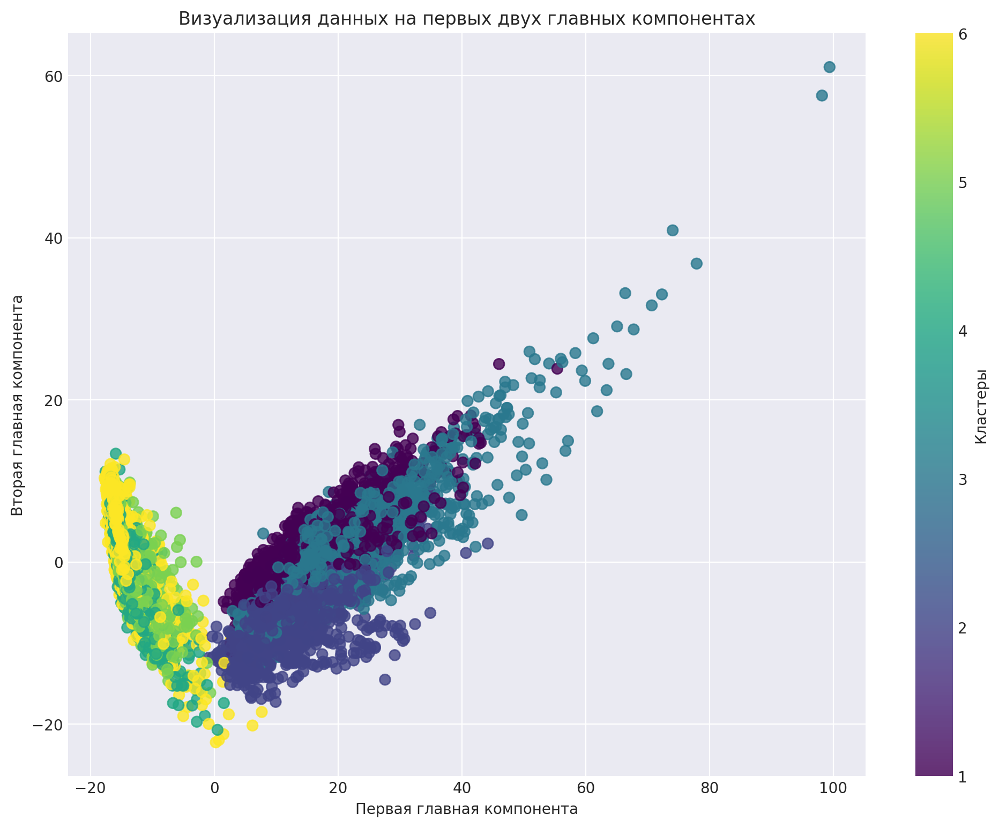

In [ ]:
# Визуализируем полученные данные
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap="viridis", s=50, alpha=0.8)
plt.xlabel("Первая главная компонента")
plt.ylabel("Вторая главная компонента")
plt.title("Визуализация данных на первых двух главных компонентах")
plt.colorbar(label="Кластеры")
plt.show()

`Выводы`
* Можно видеть как плавный переход одних кластеров в другие, так и более резкий (если цвета чётко отделены)
* Кластеры в PCA-пространстве частично перекрываются, но в целом образуют группы, которые чётко видны на графике

### **Задание 19. (0.5 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [ ]:
%%time
# Обучаем модель и засекаем время выполнения
kmeans = KMeans(n_clusters=6, n_init=100, random_state=RANDOM_STATE)
kmeans.fit(X_pca)

CPU times: total: 9.62 s
Wall time: 1.4 s


KMeans(n_clusters=6, n_init=100, random_state=42)

In [ ]:
%%time
# Засекаем время инференса
labels = kmeans.predict(X_pca)

CPU times: total: 156 ms
Wall time: 4 ms


`Выводы`
* Время обучения - около 1.5 секунд
* Время инференса - 4 мс

### **Задание 20 (0.2 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

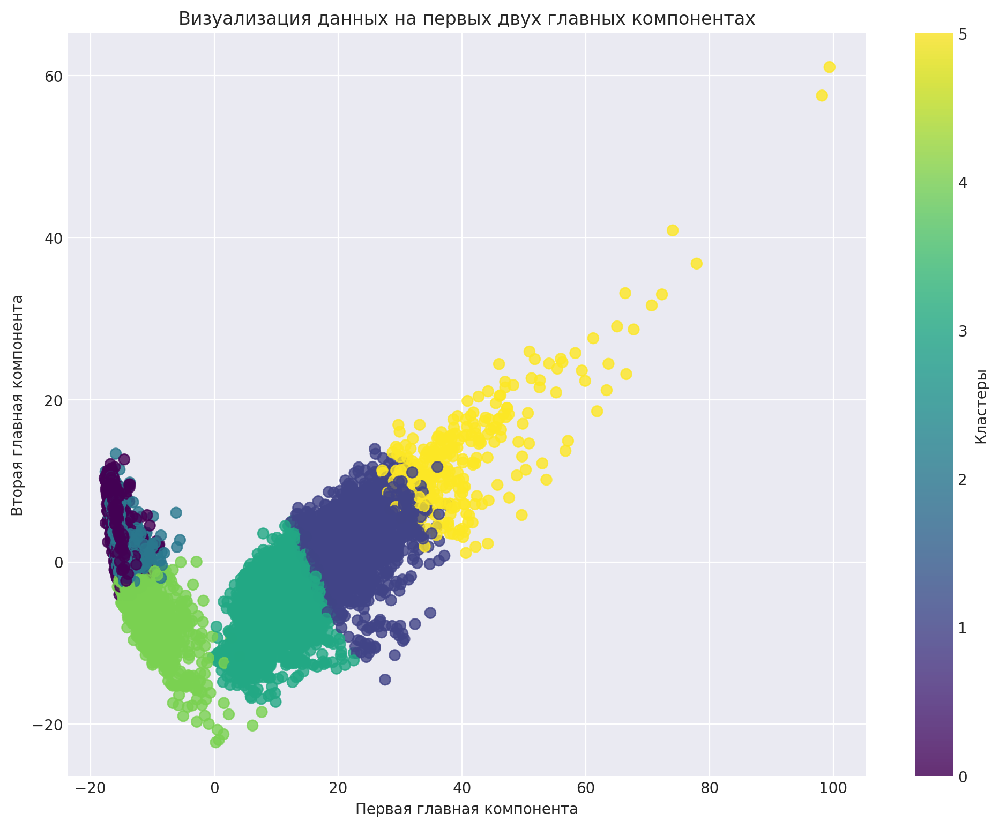

In [ ]:
# Визуализируем полученные данные
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap="viridis", s=50, alpha=0.8)
plt.xlabel("Первая главная компонента")
plt.ylabel("Вторая главная компонента")
plt.title("Визуализация данных на первых двух главных компонентах")
plt.colorbar(label="Кластеры")
plt.show()

`Выводы`
* По кластерам, найденным KMeans видно, что некоторые из них занимают относительно обособленные участки пространства, а некоторые частично перекрываются
* KMeans пытается разбить данные на 6 групп, что не всегда выделяет чёткую границу между ними (особенно на границах областей между группами)

### **Задание 21 (0.3 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [ ]:
# Будем использовать метрики AMI, ARI и V-measure (т.к. у нас есть истинные метки - y)
ari = round(ari(y, labels), 2)
ami = round(ami(y, labels), 2)
v_score = round(v_score(y, labels), 2)

print("Adjusted Rand Index:", ari)
print("Adjusted Mutual Information:", ami)
print("V-score:", v_score)

Adjusted Rand Index: 0.56
Adjusted Mutual Information: 0.42
V-score: 0.56


`Выводы`
* ARI - значение 0.56 говорит о средней степени совпадения кластеров с истинными классами (разбиение частично соответствует исходным меткам, но заметны расхождения)
* AMI - значение 0.42 указывает на то, что существует умеренное пересечение между информацией, содержащейся в кластерном разбиении и истинными метками
* V-score как гармоническое среднее между однородностью и полнотой находится на среднем уровне (0.56), что говорит о умеренном качестве кластеров с точки их чистоты (содержат объекты одного класса) и тем, насколько полно они охватывают объекты одного класса

### **Задание 22 (0.7 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

In [ ]:
%%time
# AgglomerativeClustering
agg_clust = AgglomerativeClustering(n_clusters=6, linkage="ward")
labels_agg = agg_clust.fit_predict(X_scaled)

CPU times: total: 10.1 s
Wall time: 10.1 s


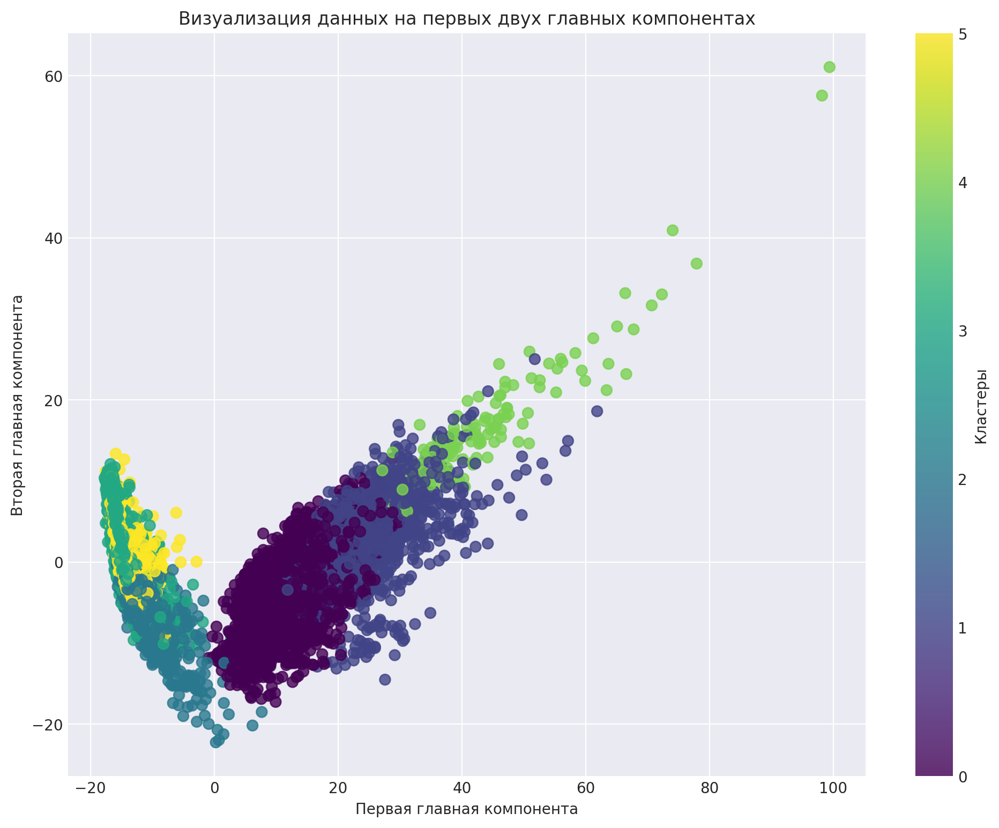

In [ ]:
# Визуализируем полученные данные
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels_agg, cmap="viridis", s=50, alpha=0.8)
plt.xlabel("Первая главная компонента")
plt.ylabel("Вторая главная компонента")
plt.title("Визуализация данных на первых двух главных компонентах")
plt.colorbar(label="Кластеры")
plt.show()

In [ ]:
# Используем те же метрики
ari = round(ari(y, labels_agg), 2)
ami = round(ami(y, labels_agg), 2)
v_score = round(v_score(y, labels_agg), 2)

print("Adjusted Rand Index:", ari)
print("Adjusted Mutual Information:", ami)
print("V-score:", v_score)

Adjusted Rand Index: 0.6
Adjusted Mutual Information: 0.46
V-score: 0.6


`Выводы`
* На графике заметно, что переходы между классами стали более плавными (что больше похоже на эталонное разделение)
* По всем трём метрикам заметно небольшое улучшение (ARI: 0.56 -> 0.60, AMI: 0.42 -> 0.46, V-score: 0.56 -> 0.60), можно сделать вывод, что алгоритм AgglomerativeClustering нашёл структуру данных чуть более согласованную с истинными метками классов

### **Задание 23 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

**Выводы для модели AgglomerativeClustering**

* Внутри ряда кластеров прослеживается схожесть по одному типу активности (особенно для самых контрастных видов — лежание (5) vs. ходьба (0)), но часть групп содержит объекты, которые в PCA-пространстве оказываются ближе друг к другу и могут соответствовать разным, но похожим по сигналам активностям
* По графику видно, что нет идеально обособленных групп, цвета кластеров плавно переходят друг в друга в нескольких зонах. Это говорит о том, что некоторые кластеры включают сразу несколько типов активности. Это согласуется с реальностью (например, человек может идти по лестнице и в какой-то момент переходить от ходьбы (0) к подъёму (1)). Кроме того мы смотрим только на первые две компоненты PCA, а различия между группами активностей могут быть заметнее в более высоких измерениях
* Если судить по метрикам качества (ARI-0.6, AMI-0.46, V-score-0.6), то можно заметить, что кластеризация лишь частично совпадает с истинными метками. По графику видно, что часть кластеров достаточно хорошо сгруппирована, однако есть и области сильного перекрытия, а значит для ряда активностей алгоритм чётких границ не находит

## **Бонус-задание (1 балл)**
![RedPanda](http://imgur.com/6Aa52Lm.png)

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации. В бонусе предлагаем вам попрактиковаться именно в этом на чудесной утке и совах (```duck.jpg``` и ```owls.jpg```)

### **(0.1 балл)**

- Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

In [2]:
# В этом бонусе только посмотрим на прекрасных сов и уток, кластеризировать не будем)
duck = Image.open('duck.jpg')
owls = Image.open('Owls.jpg')

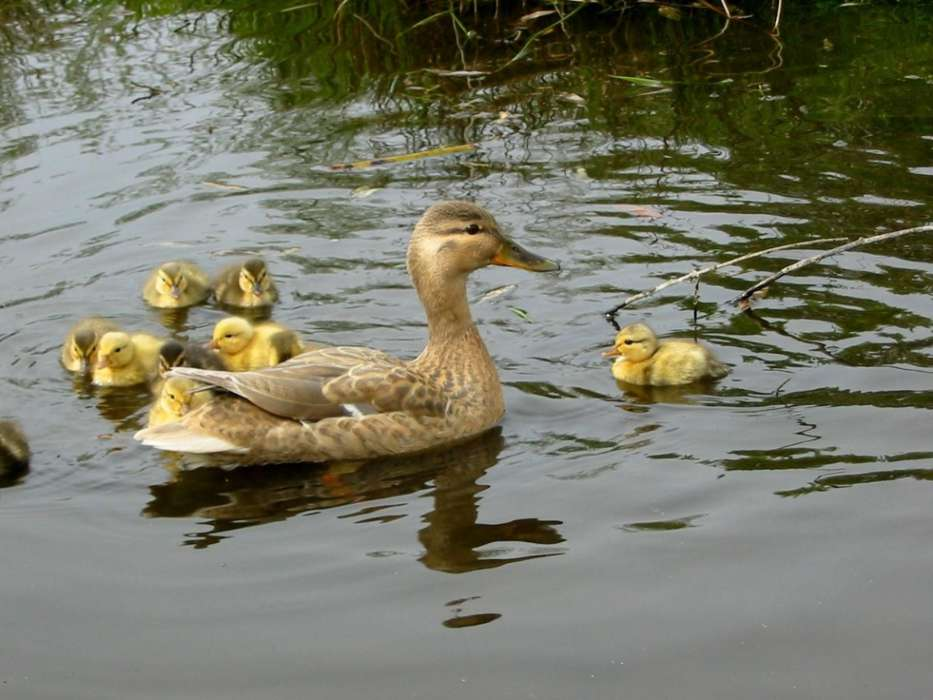

In [3]:
duck

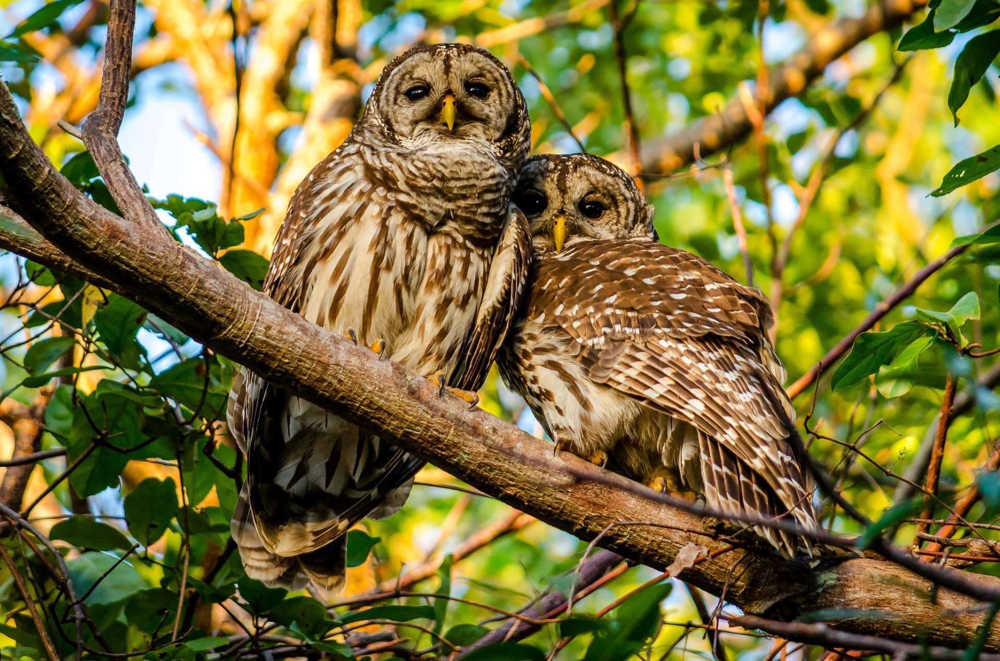

In [4]:
owls

### **(0.4 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :) )

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [ ]:
# Функция для получения сегментированного изображения
def find_components(image, lmbd, n_clusters):
    # Преобразуем картинку в numpy.ndarray
    image = np.array(image)
    
    height, width = image.shape[:2]
    channels = image.shape[2] if image.ndim == 3 else 1

    # Создаем координатную сетку для изображения
    x_coords, y_coords = np.meshgrid(np.arange(width), np.arange(height))
    
    # Преобразуем изображение в массив признаков
    pixel_colors = image.reshape(-1, channels)
    x_flat = x_coords.flatten()[:, np.newaxis]
    y_flat = y_coords.flatten()[:, np.newaxis]
    spatial_features = np.hstack((x_flat, y_flat)) * lmbd

    # Объединяем признаки в один массив
    features = np.hstack((pixel_colors, spatial_features))
    
    # Применяем KMeans
    kmeans = KMeans(n_clusters=n_clusters, random_state=RANDOM_STATE)
    kmeans.fit(features)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_
    
    # Для формирования сегментированного изображения используем только цветовые компоненты центров
    if channels == 1:
        cluster_colors = centers[:, 0].reshape(-1, 1)
    else:
        cluster_colors = centers[:, :channels]
    
    # Заменяем каждый пиксель на цвет центра его кластера
    segmented_pixels = cluster_colors[labels]
    segmented_image = segmented_pixels.reshape(height, width, channels).astype(np.uint8)
    
    return segmented_image

In [6]:
# Возьмём по 4 кластера
duck_cluster = find_components(duck, 0.3, 4)
owls_cluster = find_components(owls, 1.5, 4)

### **(0.4 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [ ]:
# В этом решении без спектральной кластеризации
def spectral_segmentation(image, n_clusters, beta, eps):
    #your code here

### **(0.1 балл)**
Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.

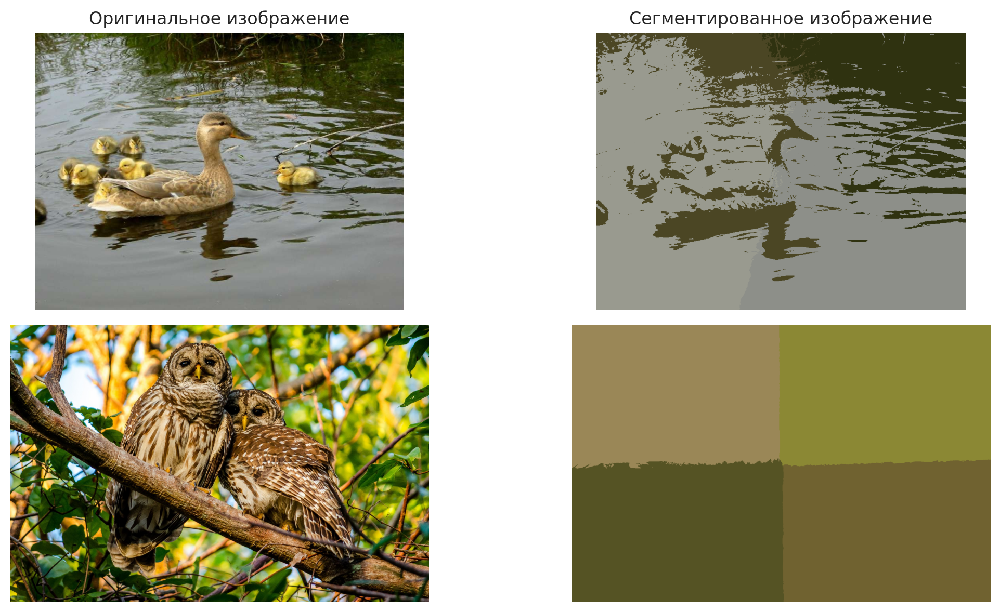

In [7]:
# Создаем сетку 2х2
fig, axes = plt.subplots(2, 2, figsize=(12, 6))

# Оригинальные утки
axes[0, 0].imshow(duck)
axes[0, 0].set_title("Оригинальное изображение")
axes[0, 0].axis("off")

# Сегментированные утки
axes[0, 1].imshow(duck_cluster)
axes[0, 1].set_title("Сегментированное изображение")
axes[0, 1].axis("off")

# Оригинальные совы
axes[1, 0].imshow(owls)
axes[1, 0].axis("off")

# Сегментированные совы
axes[1, 1].imshow(owls_cluster)
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

**Спасибо! Вы — человек — большой трудяга!**

Успокоительный котобонус :)

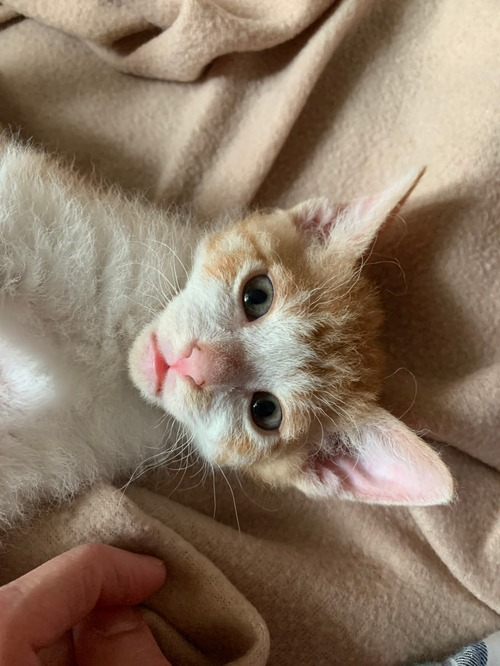

`Кот Сабрины)`